In [1]:
import requests
import pandas as pd
import numpy as np
from ladybug.epw import EPW
from lightning.pytorch import Trainer
from pathlib import Path

import json
from ml.surrogate import Surrogate
from ml.predict import predict_ubem
from weather.weather import extract


Couldn't import dot_parser, loading of dot files will not be possible.


In [2]:
sin_schedule = np.linspace(0,2*np.pi*365-1/24*2*np.pi,365*24)
sin_schedule = -np.cos(sin_schedule)/2 + 0.5
schedules = np.stack([sin_schedule]*3).reshape(1,3,8760)

In [3]:
epw = EPW("/teamspace/uploads/USA_NY_New.York-LaGuardia.AP.725030_TMYx.2004-2018.epw")
epw = EPW("C:/ProgramData/Solemma/Common/WeatherData/EPW/USA_CA_Los.Angeles.Intl.AP.722950_TMYx.2004-2018.epw")
epw = EPW("C:/ProgramData/Solemma/Common/WeatherData/EPW/USA_MA_Boston-Logan.Intl.AP.725090_TMYx.2004-2018.epw")
epw = EPW("C:/ProgramData/Solemma/Common/WeatherData/EPW/USA_NY_New.York-LaGuardia.AP.725030_TMYx.2004-2018.epw")
# epw = EPW("/teamspace/uploads/USA_CA_Los.Angeles.Intl.AP.722950_TMYx.2004-2018.epw")
# epw = EPW("/teamspace/uploads/USA_MA_Boston-Logan.Intl.AP.725090_TMYx.2004-2018.epw")
climate = extract(epw, timeseries_names=[
        "dry_bulb_temperature",
        "dew_point_temperature",
        "relative_humidity",
        "wind_direction",
        "wind_speed",
        "direct_normal_radiation",
        "diffuse_horizontal_radiation",
        "solar_azimuth",
        "solar_elevation",
        "latitude",
        "longitude",
    ])

In [4]:
config = {
    "FacadeMass": 1,
    "RoofMass": 1,
    "FacadeRValue": 4.88,
    "RoofRValue": 4.88,
    "SlabRValue": 4.88,
    "WindowUValue": 4.0,
    "WindowShgc": 0.75,
    "PeopleDensity": 0.00,
    "EquipmentPowerDensity": 6,
    "LightingPowerDensity": 10,
    "HeatingSetpoint": 20,
    "CoolingSetpoint": 24,
    "cop_heating": 1,
    "cop_cooling": 1,
    "VentilationMode": 1,
    "VentilationPerArea": 0.0001,
    "VentilationPerPerson": 0.001,
    "EconomizerSettings": 0,
    "RecoverySettings": 0,
    "Infiltration": 0.0002,
    "wwr": 0.15,
    "template_idx": 0,
    "width": 3,
    "height": 4,
    "perim_depth": 4,
    "core_depth": 4,
    "building_id": 0,
    "weight": 1,
}
for i in range(12):
    config[f"shading_{i}"] = 0
features = pd.DataFrame(data=config, index=[0])
features = pd.concat([features]*12,axis=0)
features["roof_2_footprint"] = [0,0,1]*4
features["ground_2_footprint"] = [1,0,0]*4
# features["roof_2_footprint"] = [0.25]*12
# features["ground_2_footprint"] = [0.25]*12
features["orientation"] = [*[0]*3,*[1]*3,*[2]*3,*[3]*3]

features.index = range(12)
for i in range(4):
    for j in range(3):
        features.loc[i*3+j,"name"] = f"{['bottom','middle','top'][j]}_{['south','east','north','west'][i]}"

features = pd.concat([features]*100,axis=0)
features["building_id"] = range(len(features))
features.index = range(len(features))
# shoebox_results, *_ = predict_ubem(trainer=trainer, surrogate=surrogate, features=features,schedules=schedules, climate=climate,apply_cops=False, batch_size=32,)


features_data_dict = features.to_dict(orient="tight")
schedules_data_list = schedules.tolist()
climate_data_list = climate.tolist()
job_input = {
    "features": features_data_dict,
    "schedules": schedules_data_list,
    "climate": climate_data_list,
}
job = {
    "input": job_input,
}
write = False
run = True
sync = True

if write:
    with open("api/test_input.json","w") as f:
        json.dump(job,f)

if run:
    body = job
    print("starting...")
    # add bearer token to header
    from dotenv import load_dotenv, get_key
    load_dotenv()
    bearer = get_key(".env", key_to_get="RUNPOD_API_KEY")

    run_url =    "http://localhost:8000/run"
    endpoint_url = "https://api.runpod.ai/v2/wwvjnpr2x3uzgm"
    run_url = f"{endpoint_url}/runsync" if sync else f"{endpoint_url}/run"

    response = requests.post(run_url, json=body, headers={"Authorization": f"Bearer {bearer}"})

    if sync:
        res = response.json()
        sb_data = res.pop("output")
        # print(res)
        sb_results = pd.DataFrame.from_dict(sb_data,orient="tight")
        print(len(sb_results))
        sb_results.head()
    else:
        id = response.json()["id"]
        status_url = f"{endpoint_url}/status/{id}"
        response = requests.get(status_url, headers={"Authorization": f"Bearer {bearer}"})

NameError: name 'c' is not defined

In [ ]:
id = response.json()["id"]
status_url = f"{endpoint_url}/status/{id}"
response = requests.get(status_url, headers={"Authorization": f"Bearer {bearer}"})
res = response.json()

In [ ]:
# response.text

'{"delayTime":10194,"executionTime":29746,"id":"8e4b33b8-5988-4aae-95cb-be96ef8b6c29-u1","output":{"column_names":["KeyValue","Name",null],"columns":[["Core","Heating","2018-01-01"],["Core","Heating","2018-02-01"],["Core","Heating","2018-03-01"],["Core","Heating","2018-04-01"],["Core","Heating","2018-05-01"],["Core","Heating","2018-06-01"],["Core","Heating","2018-07-01"],["Core","Heating","2018-08-01"],["Core","Heating","2018-09-01"],["Core","Heating","2018-10-01"],["Core","Heating","2018-11-01"],["Core","Heating","2018-12-01"],["Core","Cooling","2018-01-01"],["Core","Cooling","2018-02-01"],["Core","Cooling","2018-03-01"],["Core","Cooling","2018-04-01"],["Core","Cooling","2018-05-01"],["Core","Cooling","2018-06-01"],["Core","Cooling","2018-07-01"],["Core","Cooling","2018-08-01"],["Core","Cooling","2018-09-01"],["Core","Cooling","2018-10-01"],["Core","Cooling","2018-11-01"],["Core","Cooling","2018-12-01"],["Perimeter","Heating","2018-01-01"],["Perimeter","Heating","2018-02-01"],["Perime

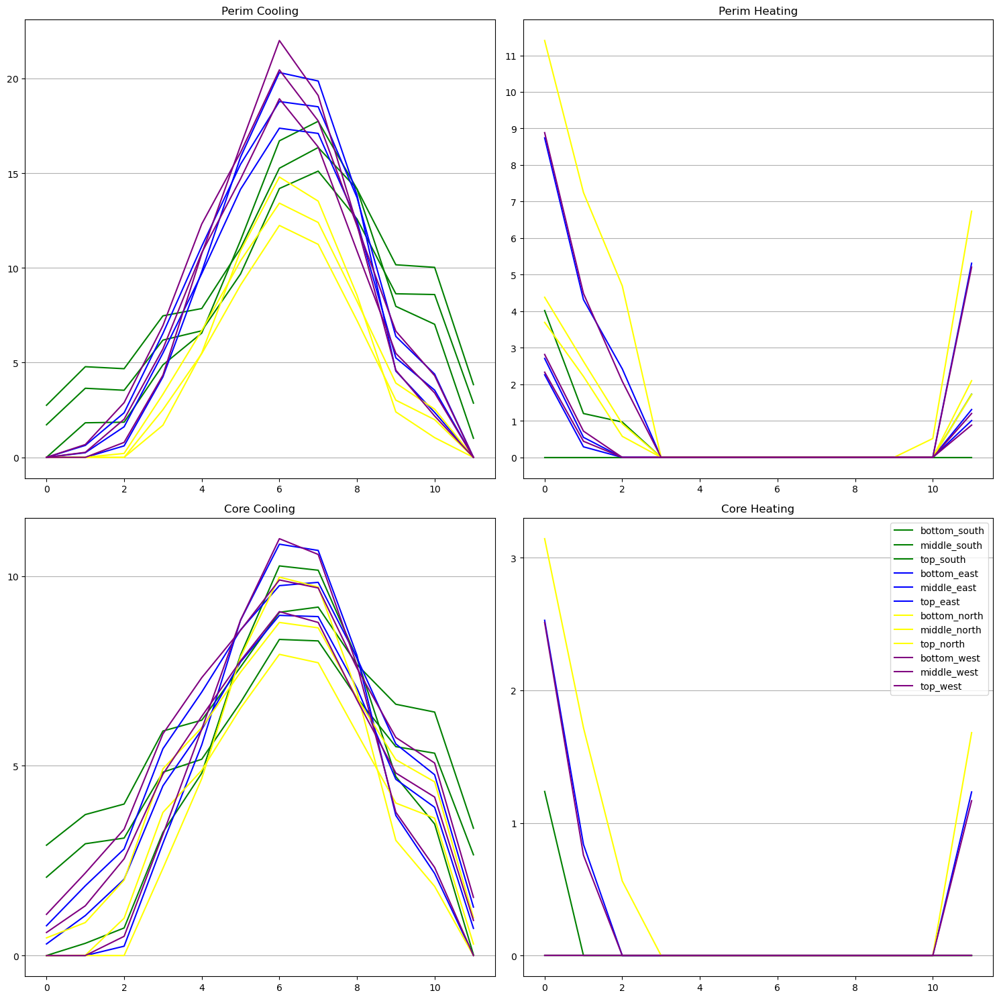

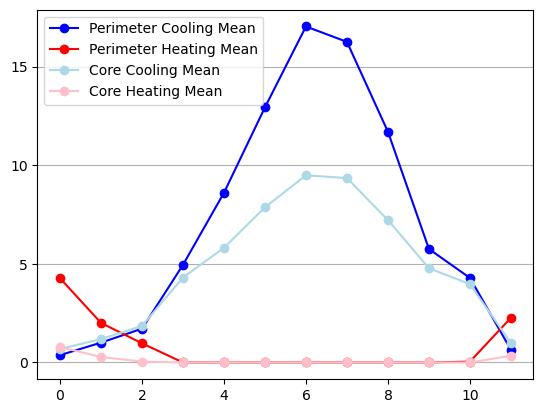

In [ ]:
# shoebox_results = shoebox_results.set_index("box_name")
import matplotlib.pyplot as plt
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

colors = {
    "bottom_south":"green",
    "middle_south": "green",
    "top_south": "green",
    "bottom_east":"blue",
    "middle_east": "blue",
    "top_east": "blue",
    "bottom_north":"yellow",
    "middle_north": "yellow",
    "top_north": "yellow",
    "bottom_west":"purple",
    "middle_west": "purple",
    "top_west": "purple",
}
fig,axs = plt.subplots(2,2,figsize=(15,15))
axs = [axs[0,0],axs[0,1],axs[1,0],axs[1,1]]

for i in range(12):
    axs[0].plot(shoebox_results["Perimeter"]["Cooling"].values[i],label=features.loc[i,"name"],c=colors[features.loc[i,"name"]])
    axs[1].plot(shoebox_results["Perimeter"]["Heating"].values[i],label=features.loc[i,"name"],c=colors[features.loc[i,"name"]])
    axs[2].plot(shoebox_results["Core"]["Cooling"].values[i],label=features.loc[i,"name"],c=colors[features.loc[i,"name"]])
    axs[3].plot(shoebox_results["Core"]["Heating"].values[i],label=features.loc[i,"name"],c=colors[features.loc[i,"name"]])


# axs[0].set_ylim([0,80])
# axs[1].set_ylim([0,5])
axs[0].yaxis.set_major_locator(MultipleLocator(5))
axs[1].yaxis.set_major_locator(MultipleLocator(1))
axs[2].yaxis.set_major_locator(MultipleLocator(5))
axs[3].yaxis.set_major_locator(MultipleLocator(1))

axs[0].grid(axis="y",which="major")
axs[1].grid(axis="y",which="major")
axs[2].grid(axis="y",which="major")
axs[3].grid(axis="y",which="major")

axs[0].set_title("Perim Cooling")
axs[1].set_title("Perim Heating")
axs[2].set_title("Core Cooling")
axs[3].set_title("Core Heating")
plt.legend()
fig.tight_layout()

fig = plt.figure()
plt.plot(shoebox_results["Perimeter"]["Cooling"].mean(axis=0).values,"-o",color="blue",label="Perimeter Cooling Mean")
plt.plot(shoebox_results["Perimeter"]["Heating"].mean(axis=0).values,"-o",color="red",label="Perimeter Heating Mean")
plt.plot(shoebox_results["Core"]["Cooling"].mean(axis=0).values,"-o",color="lightblue",label="Core Cooling Mean",)
plt.plot(shoebox_results["Core"]["Heating"].mean(axis=0).values,"-o",color="pink",label="Core Heating Mean",)
plt.gca().yaxis.set_major_locator(MultipleLocator(5))
plt.legend()
plt.grid(axis="y",which="major")